### **Dog breed identification model !!!**





#### Importing images and labels

In [206]:
#Importing Tensorflow and Tensorflow Hub
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:",tf.__version__)
print("Hub Version:",hub.__version__)

TF Version: 2.2.0
Hub Version: 0.8.0


In [207]:
#Checking for availability of GPU
print("GPU","Available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU Available


In [208]:
#Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [209]:
#Reading labels using pandas 
import pandas as pd
labels_csv=pd.read_csv("drive/My Drive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     ac2e27fa8891e1d7a2ee88196a2a4223  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


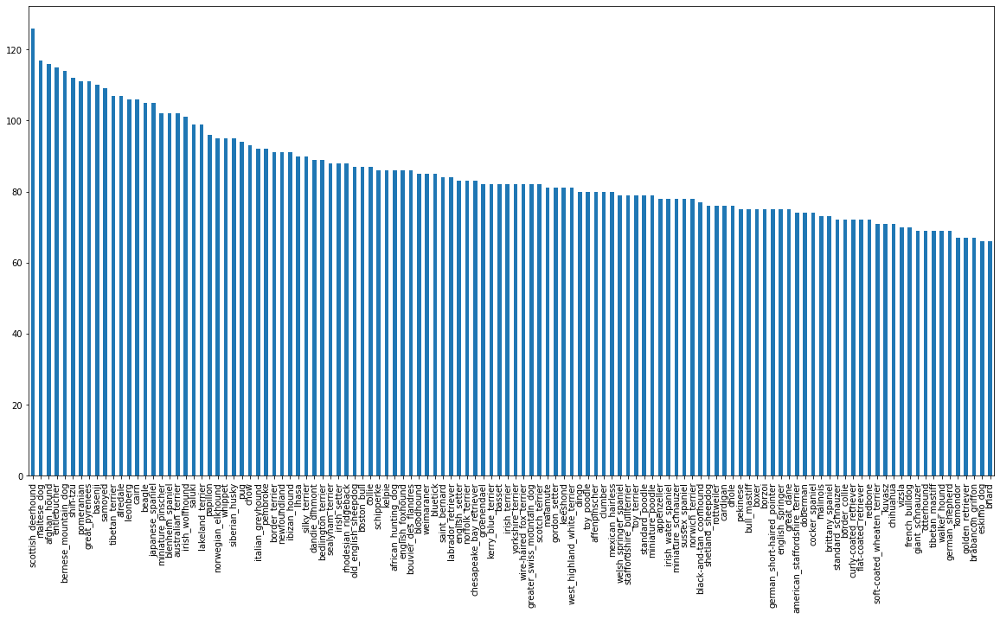

In [210]:
#Checking Number of images in each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

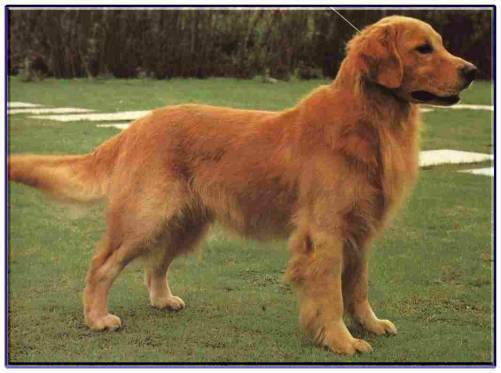

In [211]:
#To display an image
from IPython.display import Image
Image("drive/My Drive/Dog vision/train/4ae4d80eca630ded983a3fb845baa67c.jpg")

In [212]:
#List of ID paths
filenames= ["drive/My Drive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:4]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg']

In [213]:
#To check if number of filenames matches actual number of images
import os
if len(os.listdir("drive/My Drive/Dog vision/train/"))==len(filenames):
  print("Number of filenames matches number of images")
else:
  print("Number of filenames doesnot match number of actual images")

Number of filenames matches number of images


In [214]:
len(os.listdir("drive/My Drive/Dog vision/train/")), len(filenames)

(10222, 10222)

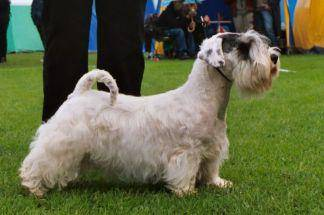

In [215]:
#To display image indexing filenames
Image(filenames[4748])

In [216]:
#To convert labels into numpy array
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [217]:
#To check if number of labels match number of filenames 
if len(labels)==len(filenames):
  print("Number of filenames matches number of labels")
else:
  print("Number of filenames donot match number of labels")

Number of filenames matches number of labels


In [218]:
#Unique labels
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [219]:
#Converting labels into boolean labels
boolean_label=[label == np.array(unique_breeds) for label in labels]
boolean_label[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [220]:
#Converting boolean into integers and getting the index of unique_breeds label
print(labels[4])
print(np.where(unique_breeds==labels[4])[0][0])
print(boolean_label[4].argmax())
print(boolean_label[4].astype(int))

golden_retriever
49
49
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


#### Splitting data into training and validation sets

In [0]:
#Splitting the data into validation set
x=filenames
y=boolean_label

In [222]:
#To define number of images to predict
num_images=1000 #@param {type:"slider",min:1000,max:10000,step:1000}
num_images

1000

In [223]:
#Splitting data into train and validation sets
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:num_images],y[:num_images],test_size=0.2,random_state=98)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [224]:
x_train[:2], y_train[:2]

(['drive/My Drive/Dog vision/train/0b6c5bc46b7a0e29cddfa45b0b786d09.jpg',
  'drive/My Drive/Dog vision/train/0a001d75def0b4352ebde8d07c0850ae.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

#### Preprocessing function

In [225]:
#Preprocessing data i.e to convert images into tensors
#Check image size
from matplotlib.pyplot import imread
image=imread(filenames[98])
image[:2], image.shape

(array([[[172, 176, 185],
         [150, 153, 160],
         [236, 239, 244],
         ...,
         [ 29,  22,  16],
         [ 30,  23,  17],
         [ 31,  24,  18]],
 
        [[174, 178, 187],
         [149, 152, 159],
         [235, 238, 243],
         ...,
         [ 27,  20,  14],
         [ 26,  19,  13],
         [ 26,  19,  13]]], dtype=uint8), (375, 500, 3))

In [226]:
#Converting into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[172, 176, 185],
        [150, 153, 160],
        [236, 239, 244],
        ...,
        [ 29,  22,  16],
        [ 30,  23,  17],
        [ 31,  24,  18]],

       [[174, 178, 187],
        [149, 152, 159],
        [235, 238, 243],
        ...,
        [ 27,  20,  14],
        [ 26,  19,  13],
        [ 26,  19,  13]]], dtype=uint8)>

In [0]:
#Preprocessing function
img_size=224
def preprocess_image(image_path):
  """
  Converts images into Tensors.
  """
  #Reading image
  image=tf.io.read_file(image_path)
  #RGB channels
  image=tf.image.decode_jpeg(image,channels=3)
  #To convert channels RGB into numbers 
  image=tf.image.convert_image_dtype(image,tf.float32)
  #To reshape image into (224,224)
  image=tf.image.resize(image,size=[img_size,img_size])
  return image

#### Get_image_label function

In [0]:
#To get a tuple of image and label
def get_image_label(image_path,label):
  """ 
  Creates a tuple of image and label and returns after preprocessing data
  """
  image=preprocess_image(image_path)
  return image,label

#### Create_batch function

In [0]:
#To create batch data of default batch size=32
batch_size=32
def create_batch(x,y=None,batch_size=batch_size,test_data=False,val_data=False):
  """
  Creates batch of images and labels, shuffles training data(data with labels) 
  & accepts validation and test data (data with no labels)but donot shuffle them
  """
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(preprocess_image).batch(batch_size)
    return data_batch
  elif val_data:
    print("Creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    #To shuffle training data
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch

In [230]:
#Creating training and validation batches
train_data_batch=create_batch(x_train,y_train)
val_data_batch=create_batch(x_val,y_val,val_data=True)

Creating training data batches
Creating validation data batches


In [231]:
train_data_batch.element_spec, val_data_batch.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#### Visualizing data batches

In [0]:
#To Visualize data_batches
import matplotlib.pyplot as plt
def show_data_batch(images,labels):
  """
  Displays 32 images of a data batch.
  """
  plt.figure(figsize=(15,10))
  for i in range(batch_size):
    ax=plt.subplot(6,6,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

#### Training data batch

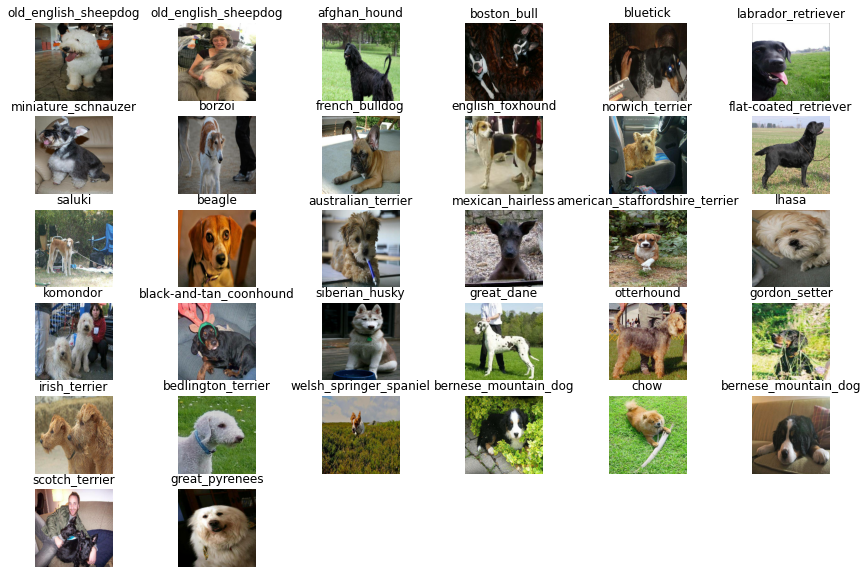

In [233]:
train_images,train_labels=next(train_data_batch.as_numpy_iterator())
show_data_batch(train_images,train_labels)

#### Validation data batch

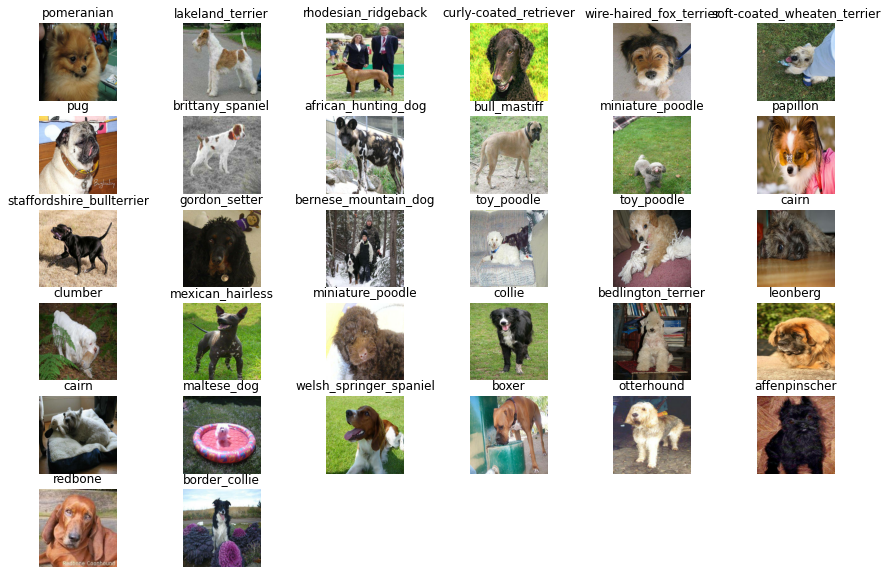

In [234]:
val_images,val_labels=next(val_data_batch.as_numpy_iterator())
show_data_batch(val_images,val_labels)

### Building a model

In [0]:
#To Setup input,output shapes and batch_size=None i.e 32 default 
input_shape=[None,img_size,img_size,3]
output_shape=len(unique_breeds)
#Model url from tensorflow hub
model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

#### Create_model function

In [0]:
#Function to create keras model
def create_model(input_shape=input_shape,output_shape=output_shape,model_url=model_url):
  print("Building model with:",model_url)
  #To setup model layers
  model=tf.keras.Sequential([hub.KerasLayer(model_url),
                             tf.keras.layers.Dense(units=output_shape,
                                                   activation="softmax")])
  #To compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  #To build the model
  model.build(input_shape)
  return model

#### Model summary

In [237]:
#To build model and check summary 
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_9 (KerasLayer)   multiple                  5432713   
_________________________________________________________________
dense_9 (Dense)              multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#### Create_tensorboard_callback function

In [238]:
#To load tensorboard extension 
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
import datetime
def create_tensorboard_callback():
  logdir=os.path.join("drive/My Drive/Dog vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early stopping callback 

In [0]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [241]:
#To create epochs for data batches
num_epochs=100 #@param {type:"slider",max:100,min:10,step:1}
num_epochs

100

#### Training a model

In [0]:
#To train a model 
def train_model():
  """
  Trains the given model.
  """
  #Creating model using function
  model=create_model()
  #Creating tensorboard callback
  tensorboard=create_tensorboard_callback()
  #Fitting the model
  model.fit(x=train_data_batch,
            epochs=num_epochs,
            batch_size=batch_size,
            callbacks=[tensorboard,early_stopping],
            validation_data=val_data_batch,
            validation_freq=1)
  return model

In [243]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 2/25 [=>............................] - ETA: 5s - loss: 5.9706 - accuracy: 0.0156    WARNING:tensorflow:Method (on_train_batch_end) is slow compared to the batch update (0.156612). Check your callbacks.


25/25 [==============================] - 6s 221ms/step - loss: 4.7676 - accuracy: 0.0800 - val_loss: 3.5684 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 5s 190ms/step - loss: 1.7446 - accuracy: 0.6700 - val_loss: 2.2074 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 5s 193ms/step - loss: 0.5834 - accuracy: 0.9413 - val_loss: 1.6413 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 190ms/step - loss: 0.2507 - accuracy: 0.9887 - val_loss: 1.4614 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 5s 190ms/step - loss: 0.1453 - accuracy: 1.0000 - val_loss: 1.3805 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 1.3417 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 5s 189ms/step - loss: 0.0749 - accuracy: 1.0000 - val_loss: 1.3126 - val_accuracy: 0.6400
Epoch 8/100

In [244]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

Reusing TensorBoard on port 6006 (pid 1596), started 3:53:20 ago. (Use '!kill 1596' to kill it.)

<IPython.core.display.Javascript object>

#### Predictions

In [245]:
#Predictions on validation data batch
val_preds=model.predict(val_data_batch,verbose=1)
val_preds, val_preds.shape

7/7 [==============================] - 1s 109ms/step


(array([[2.9017590e-03, 4.2425102e-04, 4.0454388e-04, ..., 1.2095708e-04,
         1.5375833e-04, 1.3680021e-02],
        [2.9994006e-04, 3.9148951e-04, 2.3912657e-04, ..., 3.0506249e-03,
         3.8987049e-01, 7.7490055e-04],
        [1.5980451e-05, 3.5602653e-03, 5.9094724e-05, ..., 8.5544987e-03,
         2.2359338e-04, 4.0593911e-03],
        ...,
        [6.4919568e-03, 5.0978164e-05, 2.5014810e-05, ..., 2.6604062e-05,
         5.6379595e-05, 4.9942522e-04],
        [2.6007983e-06, 1.2014277e-05, 1.3268152e-05, ..., 2.9969242e-05,
         2.3726849e-03, 2.1024100e-06],
        [5.8335536e-05, 5.0282117e-04, 5.9818011e-04, ..., 6.1791930e-03,
         2.4595044e-03, 2.3307302e-04]], dtype=float32), (200, 120))

In [246]:
print(val_preds[0])
print(f"Max value: {np.max(val_preds[0])}")
print(f"Sum:{np.sum(val_preds[0])}")
print(f"Max index:{np.argmax(val_preds[0])}")
print(f"Predicted label:{unique_breeds[np.argmax(val_preds[0])]}")

[2.9017590e-03 4.2425102e-04 4.0454388e-04 7.2718388e-04 2.3711048e-04
 8.1495149e-04 4.0867096e-03 3.5671368e-03 5.3551867e-05 6.1044359e-04
 6.6125278e-05 4.2618735e-04 3.9123124e-03 3.6082111e-04 9.8178291e-04
 1.1621524e-03 1.1124655e-04 3.0602375e-04 9.3212111e-05 3.0838510e-03
 5.4103765e-04 1.6884956e-03 6.0560845e-04 2.8872021e-04 2.3400973e-04
 2.2876696e-03 8.7149168e-04 8.6706231e-04 9.5805322e-04 8.4125409e-03
 1.8859474e-02 5.2526753e-05 3.7035745e-04 5.9194160e-03 1.5580909e-04
 2.6438497e-03 7.2583905e-04 1.6200077e-03 7.2186592e-04 1.3212437e-03
 1.9765927e-03 2.8206254e-04 7.7125512e-04 2.7996401e-04 1.6521021e-04
 3.3178625e-03 1.8858809e-03 7.7738492e-05 2.2792353e-04 3.7554416e-04
 1.4781255e-04 9.9204096e-04 1.2670355e-04 1.8974654e-03 1.2874291e-03
 1.7213220e-04 1.3267817e-03 6.0804340e-04 2.8326386e-04 1.3139287e-04
 7.0006461e-03 3.0409681e-02 1.0740028e-01 4.6999933e-04 1.8938570e-03
 1.4239260e-03 3.6370933e-05 1.5537300e-04 1.7951640e-03 1.0830525e-03
 6.410

#### Get_pred_labels function

In [247]:
#Predicting with labels
def get_pred_labels(prediction_probabilities):
  """
  Converts an array of prediction probabilities into labels.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_labels(val_preds[0])
pred_label

'pomeranian'

#### Unbatch_data function for predictions

In [0]:
#To predict on validation images and labels unbatch the val_data_batch
def unbatch_data(data):
  """
  Batched tensors of images and labels are converted into unbatched arrays of
  images and labels.
  """
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [249]:
#To unbatch validation data 
val_images,val_labels=unbatch_data(val_data_batch)
val_images[0],val_labels[0]

(array([[[0.25534865, 0.17691727, 0.14162314],
         [0.27395836, 0.19552697, 0.16023284],
         [0.27931434, 0.20088296, 0.16558883],
         ...,
         [0.2879277 , 0.3138031 , 0.28698236],
         [0.29341772, 0.33655497, 0.30518243],
         [0.3760682 , 0.4192055 , 0.3878329 ]],
 
        [[0.2740021 , 0.19557074, 0.1602766 ],
         [0.29360995, 0.21517858, 0.17988445],
         [0.29907215, 0.22064078, 0.18534665],
         ...,
         [0.23956403, 0.2772042 , 0.24646184],
         [0.24100807, 0.2880669 , 0.24885121],
         [0.32783648, 0.37489533, 0.33567962]],
 
        [[0.28547677, 0.20704542, 0.17175129],
         [0.3040529 , 0.2256215 , 0.19032739],
         [0.3095151 , 0.2310837 , 0.19578959],
         ...,
         [0.23110995, 0.2714374 , 0.24606973],
         [0.20600864, 0.25225163, 0.21344386],
         [0.2678773 , 0.30956146, 0.2730331 ]],
 
        ...,
 
        [[0.02745098, 0.02745098, 0.02745098],
         [0.03137255, 0.03137255, 0.03137

#### Preds_plot function

In [0]:
#To plot predictions
def preds_plot(prediction_probabilities,labels,images,n=22):
  """ 
  Plots the predictions for n sample.
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=get_pred_labels(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

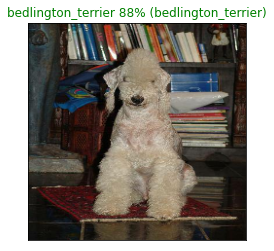

In [251]:
preds_plot(prediction_probabilities=val_preds,
          labels=val_labels,
          images=val_images)

#### To visualize top 10 predictions

In [0]:
def top_10_preds_plot(prediction_probabilities,labels,n=1):
  """
  Plots top 10 predictions
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_labels(pred_prob)
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  top_10_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="orange")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label,top_10_pred_labels):
    top_10_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

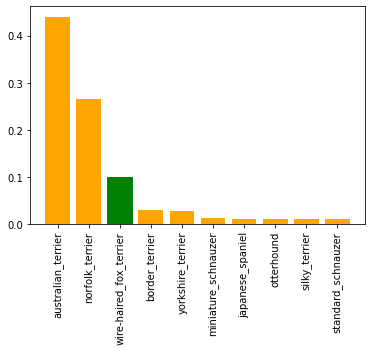

In [253]:
top_10_preds_plot(prediction_probabilities=val_preds,
                  labels=val_labels,
                  n=4)

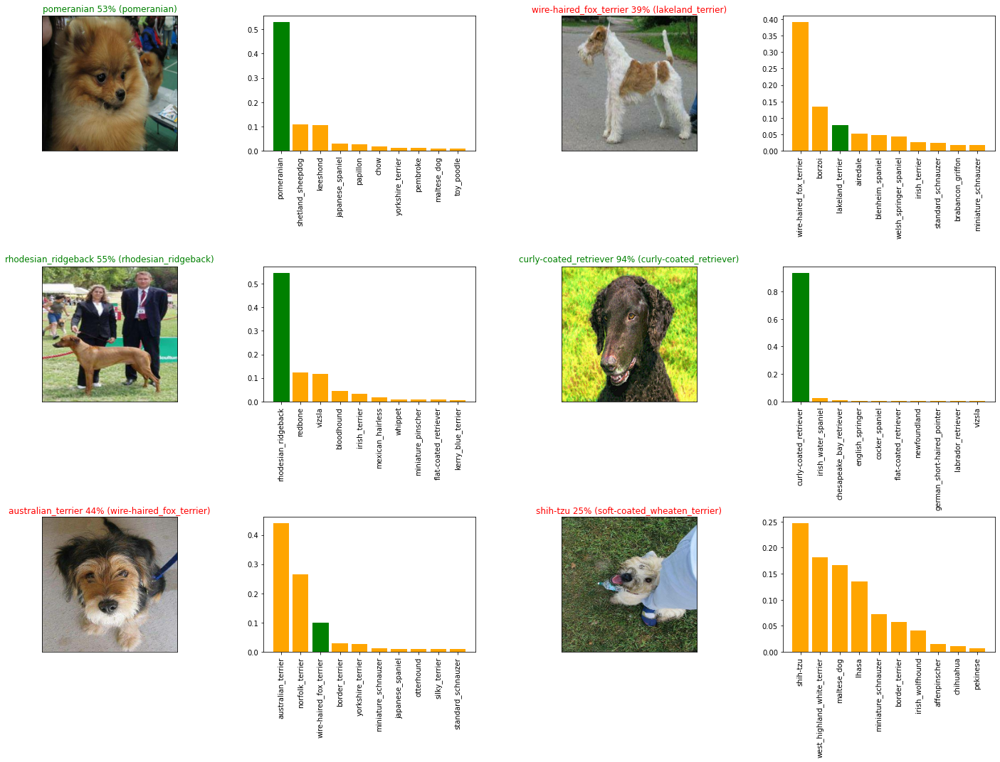

In [254]:
#Top 10 predictions on validation set
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  preds_plot(prediction_probabilities=val_preds,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  top_10_preds_plot(prediction_probabilities=val_preds,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#### Saving the model

In [0]:
def save_model(model,suffix=None):
  """
  Saves the model into given location.
  """
  model_location=os.path.join("drive/My Drive/Dog vision/Saved models",
                              datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=model_location + "-" + suffix + ".h5"
  print(f"Saving model to:", {model_path})
  model.save(model_path)
  return model_path

In [256]:
save_model(model,suffix="1000-images-dog")

Saving model to: {'drive/My Drive/Dog vision/Saved models/20200519-19351589916947-1000-images-dog.h5'}


'drive/My Drive/Dog vision/Saved models/20200519-19351589916947-1000-images-dog.h5'

#### Evaluating model

In [257]:
model.evaluate(val_data_batch)

7/7 [==============================] - 1s 124ms/step - loss: 1.2689 - accuracy: 0.6350


[1.2688511610031128, 0.6349999904632568]

#### Loading the saved model

In [0]:
def load_model(model_path):
  """
  Loads the saved model.
  """
  print(f"Loading saved model:",{model_path})
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [259]:
model_1000_images=load_model("drive/My Drive/Dog vision/Saved models/20200515-08501589532618-1000-images-dog.h5")

Loading saved model: {'drive/My Drive/Dog vision/Saved models/20200515-08501589532618-1000-images-dog.h5'}


In [260]:
model_1000_images.evaluate(val_data_batch)

7/7 [==============================] - 1s 107ms/step - loss: 1.2673 - accuracy: 0.6250


[1.2673356533050537, 0.625]

#### Training on full data

In [261]:
full_data=create_batch(x,y)

Creating training data batches


In [262]:
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [0]:
full_model_tensorboard=create_tensorboard_callback()

In [0]:
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [265]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

Reusing TensorBoard on port 6006 (pid 1596), started 3:53:32 ago. (Use '!kill 1596' to kill it.)

<IPython.core.display.Javascript object>

In [266]:
full_model.fit(x=full_data,
               epochs=num_epochs,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
  2/320 [..............................] - ETA: 2:14 - loss: 5.7558 - accuracy: 0.0000e+00WARNING:tensorflow:Method (on_train_batch_end) is slow compared to the batch update (0.358554). Check your callbacks.


320/320 [==============================] - 59s 185ms/step - loss: 1.3552 - accuracy: 0.6644
Epoch 2/100
320/320 [==============================] - 61s 191ms/step - loss: 0.4007 - accuracy: 0.8835
Epoch 3/100
320/320 [==============================] - 60s 186ms/step - loss: 0.2391 - accuracy: 0.9336
Epoch 4/100
320/320 [==============================] - 59s 185ms/step - loss: 0.1551 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 59s 183ms/step - loss: 0.1032 - accuracy: 0.9814
Epoch 6/100
320/320 [==============================] - 59s 186ms/step - loss: 0.0783 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 59s 184ms/step - loss: 0.0595 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 59s 184ms/step - loss: 0.0460 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 59s 184ms/step - loss: 0.0380 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 59s 184ms/step - los

In [273]:
save_model(full_model, suffix="full_model")

Saving model to: {'drive/My Drive/Dog vision/Saved models/20200519-20011589918506-full_model.h5'}


'drive/My Drive/Dog vision/Saved models/20200519-20011589918506-full_model.h5'

In [274]:
load_full_model=load_model("drive/My Drive/Dog vision/Saved models/20200519-20011589918506-full_model.h5")

Loading saved model: {'drive/My Drive/Dog vision/Saved models/20200519-20011589918506-full_model.h5'}


In [275]:
test_location="drive/My Drive/Dog vision/test/"
test_filenames=[test_location + fname for fname in os.listdir(test_location)]
test_filenames[:10]

['drive/My Drive/Dog vision/test/f407f19970c6d8d516722e899adc599c.jpg',
 'drive/My Drive/Dog vision/test/f155d5fe889d139892c1d7d46804f419.jpg',
 'drive/My Drive/Dog vision/test/efcb9740d2350a5aba4344ae5994eb37.jpg',
 'drive/My Drive/Dog vision/test/e9c961dc49fdf960fc46c8b54ae1996d.jpg',
 'drive/My Drive/Dog vision/test/e85d4e2707683df0e6387e19b67b873d.jpg',
 'drive/My Drive/Dog vision/test/ecba66c5313a2a5fd4017a039a9501b6.jpg',
 'drive/My Drive/Dog vision/test/ef59760870674327ca5d004bae427422.jpg',
 'drive/My Drive/Dog vision/test/f4496b7d4565b8bdebe844229a339796.jpg',
 'drive/My Drive/Dog vision/test/f0f205d037fe626670165aca00fc8b81.jpg',
 'drive/My Drive/Dog vision/test/e864985e40823a56d3ad8594066d0641.jpg']

In [276]:
len(test_filenames)

10357

In [277]:
test_data_batch = create_batch(test_filenames,test_data=True)

Creating test data batches


In [278]:
test_preds = load_full_model.predict(test_data_batch,
                                             verbose=1)

324/324 [==============================] - 6924s 21s/step


In [279]:
test_preds[:10]

array([[3.03017615e-12, 2.67551636e-14, 9.06187018e-13, ...,
        1.96174188e-09, 2.50772883e-12, 6.81289809e-14],
       [8.30080796e-12, 7.63785493e-11, 7.29451415e-08, ...,
        6.98934264e-06, 3.51727827e-12, 9.08776943e-11],
       [5.62381695e-12, 1.18459354e-07, 1.84440584e-13, ...,
        5.71497277e-12, 3.97047106e-09, 2.73891043e-09],
       ...,
       [1.62584890e-10, 1.86015509e-11, 8.32224734e-10, ...,
        4.82655929e-11, 6.11473719e-12, 1.28684889e-07],
       [2.05206246e-15, 2.52247771e-11, 2.61333625e-13, ...,
        9.73508080e-11, 4.31371419e-08, 2.92221932e-12],
       [3.90232771e-08, 4.29880975e-09, 3.67595567e-06, ...,
        2.98130326e-04, 3.78106620e-07, 1.53158240e-07]], dtype=float32)

##### Predictions on user inputs

In [0]:
user_input_path="drive/My Drive/Dog vision/doggiesss/"

In [0]:
user_image= [user_input_path + fname for fname in os.listdir(user_input_path)]

In [291]:
user_data_batch = create_batch(user_image, test_data=True)

Creating test data batches


In [292]:
user_preds = load_full_model.predict(user_data_batch,verbose=1)

1/1 [==============================] - 0s 996us/step


In [293]:
user_pred_labels = [get_pred_labels(user_preds[i]) for i in range(len(user_preds))]
user_pred_labels

['labrador_retriever',
 'chow',
 'saint_bernard',
 'great_dane',
 'boxer',
 'tibetan_mastiff',
 'brittany_spaniel']

In [0]:
user_images = []
for image in user_data_batch.unbatch().as_numpy_iterator():
  user_images.append(image)

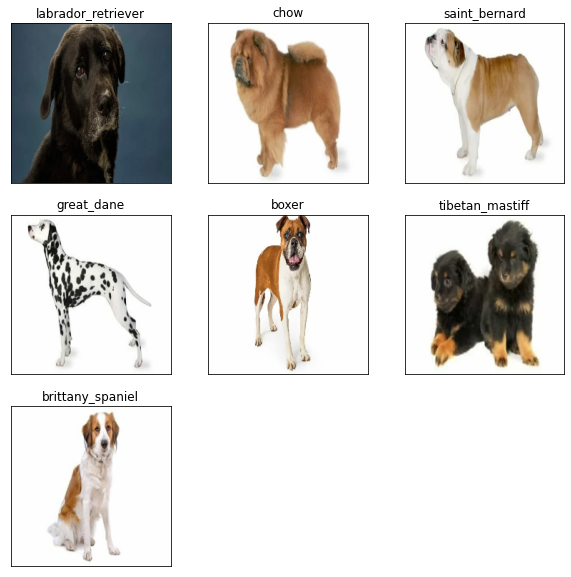

In [308]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(user_images):
  plt.subplot(3, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(user_pred_labels[i])
  plt.imshow(image)